In [37]:
# Set the paths for the rsnapsim and rsnaped directories
# and the gene file and settings YAML for the rsnaped simulation.

rsnapsim_dir = r'../../'  # path to the rsnapsim directory
rsnaped_dir = r'../../../rSNAPed/' # path to the rsnaped directory
gene_file = r'rsnapsim_tutorial_august2025/pGG167(12xST-KDM5B-BoxB-MS2).dna' # Gene file for the model
rsnaped_settings_yaml = r'rsnapsim_tutorial_august2025/kdm5b_12xSun.yaml' # Settings YAML for the rsnaped simulation
image_dir = r'rsnapsim_tutorial_august2025'  # Directory for images in this tutorial.

In [18]:
%%capture
import os; from os import listdir; from os.path import isfile, join
import re  
from skimage.io import imread
from skimage.exposure import rescale_intensity
import numpy as np 
from tqdm.notebook import tqdm
from timeit import default_timer as timer
import scipy
import pandas as pd
import shutil
import pathlib
import sys
import seaborn as sns
from skimage.measure import approximate_polygon
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

import os
homedir = os.getcwd()
os.chdir(homedir)

os.chdir(rsnapsim_dir)
import rsnapsim as rsnp
os.chdir(homedir)

import scipy.stats as stats
import matplotlib.pyplot as plt 

plt.style.use("dark_background")

# Defining directories
current_dir = pathlib.Path(rsnaped_dir).absolute()
sequences_dir = current_dir.joinpath('DataBases','gene_files')
video_dir = current_dir.joinpath('DataBases','videos_for_sim_cell')
masks_dir = current_dir.joinpath('DataBases','masks_for_sim_cell')

# Importing rSNAPed
sys.path.append(str(current_dir.joinpath('rsnaped')))
import rsnaped as rsed

from IPython.display import HTML, Image
import matplotlib.pyplot as plt
import matplotlib.animation 
import numpy as np

import matplotlib.animation as mpani

import yaml

## rSNAPsim models

In [19]:
###############################################################################
# Load the kdm5b sequence
###############################################################################

# Overwrite mRNA 1, manually overwrite the kdm5b yaml with the correct CDS since by 
# default it uses the first largest CDS. 
# In this example, we are not adding a tag, because the CDS is already tagged in the 
# gene file.
_,_,tagged_CDSs,_ = rsnp.seqmanip.open_seq_file(str(gene_file), add_tag=False)


KDM5B_12xSun = tagged_CDSs['+1'][0]

In [20]:
rsnp.seqmanip.open_seq_file?

Signature: rsnp.seqmanip.open_seq_file(seqfile, min_codons=80, add_tag=True)
Docstring:
Opens a given sequence file (.txt, .fa, .gb, .dna) and reads sequence
info, converts all valid sequences beyond the user defined codon limit
into protein objects. 

Parameters
----------
seqfile : str
    file path string to the sequence file of interest
min_codons : int, optional
    minimum amount of codons to be considered a protein, by default 80
add_tag : bool, optional
    add a default fluorescent tag to all proteins? by default True

Returns
-------
protein_strs : dict
    dictionary keyed by ORF of all sequences considered valid proteins
proteins : dict
    protein object dicionary sorted by ORF for all detected proteins
tagged_proteins : dict
    dictionary of poi objects with detected tags sorted by ORF
sequence_str : str
    The sequence detected from the sequence file
File:      ~/Dropbox/GitHub/rSNAPsim/rsnapsim/SequenceManipMethods.py
Type:      method

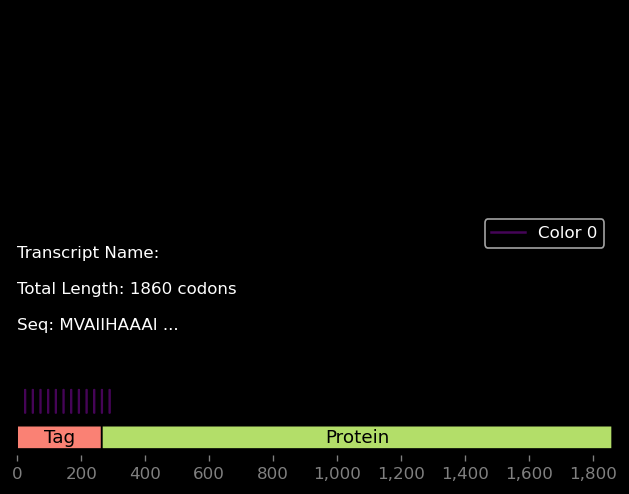

In [21]:
KDM5B_12xSun.visualize_mrna_strand()

In [22]:
# Print the amino acid sequence of KDM5B_12xSun in chunks of 80 characters
print('\n'.join( [KDM5B_12xSun.aa_seq[i:i+80] for i in range(0, int(len(KDM5B_12xSun.aa_seq)), 80)] ))

MVAIIHAAAIIGPGGSGGGGSGGEELLSKNYHLENEVARLKKGSGSGEELLSKNYHLENEVARLKKGSGSGEELLSKNYH
LENEVARLKKGSGSGEELLSKNYHLENEVARLKKGSGSGEELLSKNYHLENEVARLKKGSGSGEELLSKNYHLENEVARL
KKGSGSGEELLSKNYHLENEVARLKKGSGSGEELLSKNYHLENEVARLKKGSGSGEELLSKNYHLENEVARLKKGSGSGE
ELLSKNYHLENEVARLKKGSGSGEELLSKNYHLENEVARLKKGSGSGEELLSKNYHLENEVARLKKGSGSGAIAMEAATT
LHPGPRPALPLGGPGPLGEFLPPPECPVFEPSWEEFADPFAFIHKIRPIAEQTGICKVRPPPDWQPPFACDVDKLHFTPR
IQRLNELEAQTRVKLNFLDQIAKYWELQGSTLKIPHVERKILDLFQLNKLVAEEGGFAVVCKDRKWTKIATKMGFAPGKA
VGSHIRGHYERILNPYNLFLSGDSLRCLQKPNLTTDTKDKEYKPHDIPQRQSVQPSETCPPARRAKRMRAEAMNIKIEPE
ETTEARTHNLRRRMGCPTPKCENEKEMKSSIKQEPIERKDYIVENEKEKPKSRSKKATNAVDLYVCLLCGSGNDEDRLLL
CDGCDDSYHTFCLIPPLHDVPKGDWRCPKCLAQECSKPQEAFGFEQAARDYTLRTFGEMADAFKSDYFNMPVHMVPTELV
EKEFWRLVSTIEEDVTVEYGADIASKEFGSGFPVRDGKIKLSPEEEEYLDSGWNLNNMPVMEQSVLAHITADICGMKLPW
LYVGMCFSSFCWHIEDHWSYSINYLHWGEPKTWYGVPGYAAEQLENVMKKLAPELFVSQPDLLHQLVTIMNPNTLMTHEV
PVYRTNQCAGEFVITFPRAYHSGFNQGFNFAEAVNFCTVDWLPLGRQCVEHYRLLHRYCVFSHDEMICKMASKADVLDVV
VASTVQKDMAIMIEDEKALRETVRKLGV

In [23]:
###############################################################################
# Make a new custom model for kdm5b 12xSun that can FRAP or ROA
###############################################################################

recompile_model = True
if not recompile_model:
    try:
        model = rsnp.tasep_model('kdm5b_12xSun_ROA_FRAP') # model object
        model.load_saved_cmodel('kdm5b_12xSun_ROA_FRAP')
        make_model = 0
        print('Was able to load saved c++ model')
    except:
        print('Could not load saved c++ model..... attempting to recompile')
        make_model = 1
else:
    make_model = 1
if make_model:

    # Make the mRNA object
    mRNA = KDM5B_12xSun                           # pull out the main open reading frame
    mRNA.ke_mu = 5                                # set the elongation rate (1/s)
    mRNA_length = len(mRNA.kelong)                # get the length of the mRNA

    # Read through the sequence to determine where tags are located, and save that information under
    # the attribute multiframe_epitopes.  File of tag sequences is at rsnp.cdict in attribute 'tag_dict'.
    mRNA.generate_3frame_tags()                   # call to generate all open reading frames
    
    # Generate the matrices that define the TASEP model from the mRNA object
    model = rsnp.tasep_model('kdm5b_12xSun_ROA_FRAP', mRNA=mRNA) # model object
    
    # Make the kelong mat (manually adding an extra location that is equal to zero, so particles dont 
    # run over the simulation). The reason for this is that the c++ code could pull random numbers 
    # from memory once the particle reaches the end of the mRNA, and this would cause a segmentation fault.
    kelong_mat = np.zeros([3, mRNA_length+1])
    kelong_mat[0, :-1] = mRNA.kelong
    #kelong_mat[1, :-2] = propf.get_k(mRNA.nt_seq[1:-2], .1, 10, 10)[1:-1]
    #kelong_mat[2, :-2] = propf.get_k(mRNA.nt_seq[2:-1], .1, 10, 10)[1:-1]
    kelong_mat[0, -2] = 0
    
    model._kelong_mat = kelong_mat #override the current kelongation mat

    t_harringtonine = 1e6 # time of harringtonine treatment in seconds
    t_FRAP = 1e6          # time of FRAP in seconds
    FRAP_length = 10      # ten seconds
    footprint = 9         # footprint of the ribosome in amino acids
    parameters = [0.033, 5, mRNA_length, t_harringtonine, t_FRAP, FRAP_length]
    
    # Reaction Definitions - the following reactions use the following variables:
    # See blank_model_src.cpp for more information on the variables.
    # k == parameters
    # t == time
    # p == particle array -- information about the ribosomes (one row per ribosome, columns are: id, frame, exist, loc, # Probes in each color, #Reactions Fired)
    # l == lattice information -- physical space where the particles are located (boolean array of length mRNA_length+1, where 1 means occupied and 0 means unoccupied)
    # ke == elongation matrix -- NFrames x NLocations matrix, where NFrames is the number of frames in the mRNA and NLocations is the length of the mRNA.
    # o == other information -- 'occupied' list of occupied locations, length of max number of particles
    # pr == probe information -- 'probe matrix' showing locations of probes. Constant. NFrames x NLocations matrix.
    # s == simulation information -- 'states' 1xN_s
    # r == ribosome information -- 'resources' 1XN_r
    # nr == number of ribosomes -- current number of ribosomes in the simulation

    # DEFAULT STEPPING INITIATION
    # Add a ribosome at location 0 if there is no ribosome there or within the footprint, 
    # and the time is less than t_harringtonine.
    init = lambda k,t,p,ke,o,l,pr,s,r,nr: (1-np.any(l[0:0+footprint]))*k[0]*(t < k[3])
    model.add_lattice_reaction(init, rxn_name = 'initiation', frame=0, loc=0, dexist=1,)
    
    # DEFAULT TERMINATION 
    # Remove the ribosome at the end of the mRNA.
    leave = lambda k,t,p,ke,o,l,pr,s,r,nr: l[k[2]-1]*k[1] #(lattice location 590 = 1) * parameter
    model.add_lattice_reaction(leave, rxn_name='termination', frame=0, loc=1859, dexist=-1,)
    
    FRAP = lambda k,t,p,ke,o,l,pr,s,r,nr: [10000*(t > k[4])*(t < k[4]+k[5])*(p[i,4] > 0) for i in range(nr)]
    model.add_ribosome_reaction(FRAP, rxn_name='frap', dprobes=[-1], dprobe_inds=[0]) 

    # DEFAULT STEPPING OF ELONGATION USING THE ELONGATION MATRIX
    #default stepping
    elong_step = lambda k,t,p,ke,o,l,pr,s,r,nr: [ (ke[p[i,2], p[i,3]])*(1 - sum(l[p[i,3]+1:p[i,3]+footprint])) for i in range(nr)]
    model.add_ribosome_reaction(elong_step, rxn_name='elongation', dloc=1) 
    
    # finally specify which reactions are ribosome specific
    model._ribosome_reactions = [2,3]
    model._constant_reactions = [0,1,]
    model._lattice_arr0 = np.zeros([model._length+1], dtype=int)
    
    model.compile_model_c()



converting propensities to c...
[<function <lambda> at 0x16a7b0720>, <function <lambda> at 0x16a7b07c0>]
 (1-np.any(l[0:0+footprint]))*k[0]*(t < k[3])
 (1-np.any(l[0:0+footprint]))*k[0]*(t < k[3])
Detected comment:

fstring:
 (1-np.any(l[0:0+footprint]))*k[0]*(t < k[3])
 (1-np.any(l[0:0+footprint]))*k[0]*(t < k[3])
[0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[False, False, True, False, False, False, False, False, False, False, True, False, False, False, False, True, False, False, False, False, True, False, False, True, False, False, False, False, False]
['(', '1', '-', 'np.any', '(', 'l', '[', '0', ':', '0', '+', 'footprint', ']', ')', ')', '*', 'k', '[', '0', ']', '*', '(', 't', '<', 'k', '[', '3', ']', ')']
UNKNOWN ELEMENTS: 
[]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
*** GETTING ELEMENTS***
(1-np.any(lattice_arr{0:0+9}))*parameters{0}*(tc<parameters{3})
(1-np.any(lattice_arr{0:0+9}))*parameters{0}*(tc<parameters{3})
**

In [24]:
# Look at the tag locations
mRNA.multiframe_epitopes


[{'T_SunTag': [23, 47, 71, 95, 119, 143, 167, 191, 215, 239, 263, 287]},
 {},
 {}]

In [25]:
# Explore Model properties
model.__dict__

{'name': 'kdm5b_12xSun_ROA_FRAP',
 '_length': 1860,
 'particle_size': 9,
 'footprint': 9,
 '_max_particles': 211,
 '_state_mat': array(0, dtype=int32),
 '_probe_mat': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], shape=(3, 1860)),
 '_n_colors': 1,
 '_resource_mat': array(0, dtype=int32),
 '_propensities': [<function __main__.<lambda>(k, t, p, ke, o, l, pr, s, r, nr)>,
  <function __main__.<lambda>(k, t, p, ke, o, l, pr, s, r, nr)>,
  <function __main__.<lambda>(k, t, p, ke, o, l, pr, s, r, nr)>,
  <function __main__.<lambda>(k, t, p, ke, o, l, pr, s, r, nr)>],
 '_parameters': [],
 '_prop_ids': [0, 0, 0, 0],
 '_constant_rxn_bool': [True, True, False, False],
 '_constant_reactions': [0, 1],
 '_ribosome_reactions': [2, 3],
 '_n_rxns': 4,
 '_n_pars': 0,
 '_n_kelong': 3,
 '_n_frames': 3,
 '_n_states': 0,
 '_n_resources': 0,
 '_rxn_mat': array([[ 2.000e+00,  0.000e+00,  0.000e+00,  0.000e+00,  1.000e+00,
          0.000e+

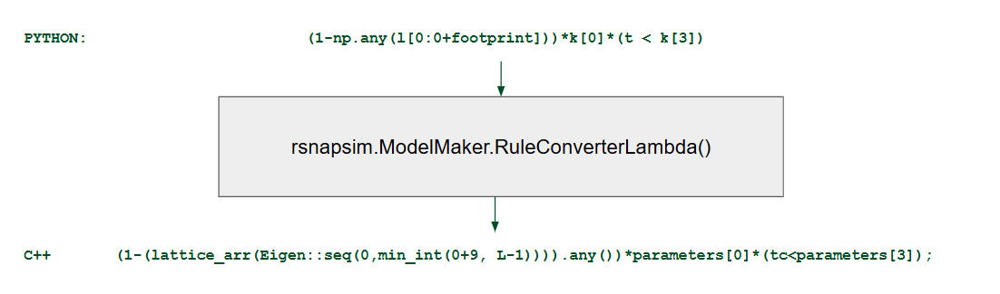

In [26]:
Image(filename=pathlib.Path(image_dir).absolute().joinpath('ruleconverter.png'))
# we can go take a look at what was made

In [27]:
t_harr = 1000
t_FRAP = 1e6
t_FRAP_stop = 1e6+10

k_init = 0.033
ke_mu = 5
model.set_parameters([k_init, ke_mu, len(KDM5B_12xSun.kelong), t_harr, t_FRAP, t_FRAP_stop,]) # how do we change parameters now?
soln = rsnp.solver.solve_ssa(model, np.linspace(0,2000,2001), cplus=True)

In [30]:
soln.__dict__
dir(soln)

['I',
 'L',
 '_I',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__firstlineno__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__static_attributes__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'burnin',
 'condense_ribosome_array',
 'convert_to_aas',
 'intensity_arr',
 'kelong_mat',
 'lattice_arr',
 'n_colors',
 'n_traj',
 'resource_array',
 'ribosome_array',
 'save',
 'solve_time',
 'state_array',
 't']

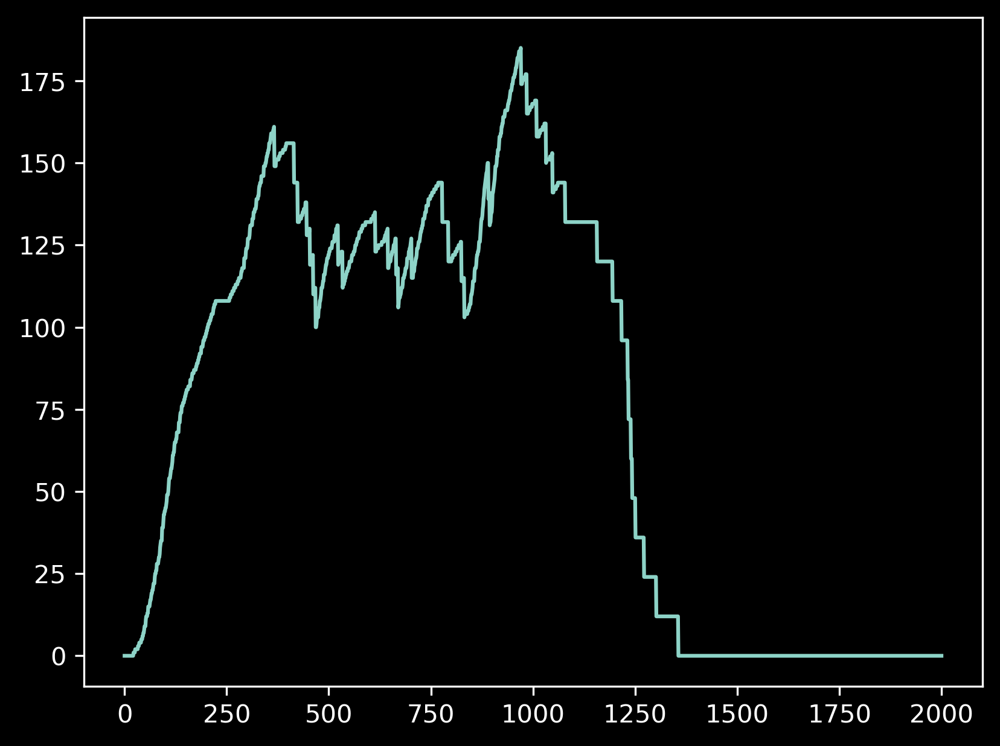

In [28]:
plt.plot(soln.I[0])

### Design our own model

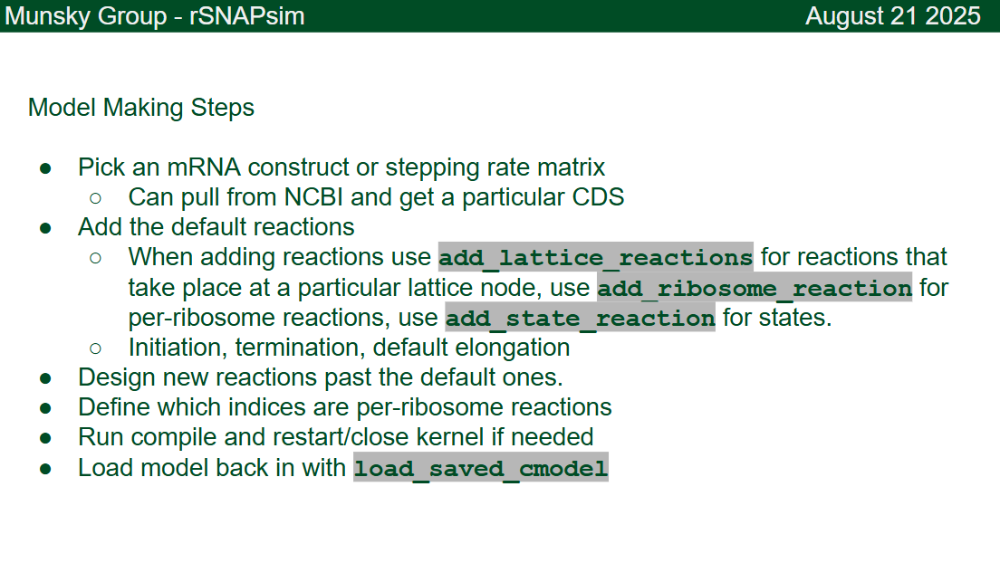

In [31]:
Image(filename=pathlib.Path(image_dir).absolute().joinpath('model_making.png'))

In [ ]:
# Make the mRNA object
# we can pull a new one or use the kdm5b
mRNA = #<mRNA object>                            
mRNA.ke_mu = 5
mRNA_length = len(mRNA.kelong)                  # get the length of the mRNA
mRNA.generate_3frame_tags()                     # call to generate all open reading frames

#model = rsnp.tasep_model(<MODEL NAME>, mRNA=mRNA) # model object

# Make the kelong mat (manually adding an extra location that is equal to zero, so particles dont run over the simulation)
kelong_mat = np.zeros([3, mRNA_length+1])
kelong_mat[0, :-1] = mRNA.kelong
#kelong_mat[1, :-2] = propf.get_k(mRNA.nt_seq[1:-2], .1, 10, 10)[1:-1]
#kelong_mat[2, :-2] = propf.get_k(mRNA.nt_seq[2:-1], .1, 10, 10)[1:-1]
kelong_mat[0, -2] = 0

model._kelong_mat = kelong_mat #override the current kelongation mat with what you want

## DEFINE parameters
parameters = []

# DEFAULT STEPPING INITIATION
init = lambda k,t,p,ke,o,l,pr,s,r,nr: (1-np.any(l[0:0+footprint]))*k[0]
model.add_lattice_reaction(init, rxn_name = 'initiation', frame=0, loc=0, dexist=1,)

# DEFAULT TERMINATION 
leave = lambda k,t,p,ke,o,l,pr,s,r,nr: l[k[2]-1]*k[1] #(lattice location 590 = 1) * parameter
model.add_lattice_reaction(leave, rxn_name='termination', frame=0, loc=<MRNA_LENGTH>, dexist=-1,)

# DEFAULT STEPPING OF ELONGATION USING THE ELONGATION MATRIX
#default stepping
elong_step = lambda k,t,p,ke,o,l,pr,s,r,nr: [ (ke[p[i,2], p[i,3]])*(1 - sum(l[p[i,3]+1:p[i,3]+footprint])) for i in range(nr)]
model.add_ribosome_reaction(elong_step, rxn_name='elongation', dloc=1) 

# finally specify which reactions are ribosome specific (i.e, these need to be replicated for every ribosome.)
model._ribosome_reactions = []
model._constant_reactions = []
model._lattice_arr0 = np.zeros([model._length+1], dtype=int) #manually add one extra lattice node just in case

model.compile_model_c()

SyntaxError: invalid syntax (213767620.py, line 3)

In [ ]:
## what can a ribosome reaction do?
model.add_ribosome_reaction?

In [ ]:
### Test our new model here, plot the solution, does it run, does it make sense?

## rSNAPed


In [32]:
#Quality of life functions

def show_vid(video_array):
    fig,ax = plt.subplots(1,1)
    maxes = np.array([max(video_array[:,:,:,i].flatten()) for i in [0,1,2]])
    maxes[2] = 14000
    im = plt.imshow(video_array[0]/maxes)
    frame_ids = np.arange(len(video_array))
    def animate(i):
        im.set_array(video_array[i]/maxes)

    ani = mpani.FuncAnimation(fig, animate, frames=len(video_array))
    return HTML(ani.to_html5_video())

In [34]:
with open(rsnaped_settings_yaml, 'r') as f:
    config_dict = yaml.safe_load(f)

config_dict

{'name': 'Test Cell',
 'diffusion': {'initialization': {'start': 'uniform', 'parameters': []},
  'motion': {'diffusion_coefficient': 0.3, 'tstep': 1.0, 'elasticity': 1.0},
  'jitter': {'use': True,
   'n_channels': 3,
   'method': 'gaussian',
   'parameters': [0.2]},
  'simulate_z': {'use': False,
   'method': 'gaussian',
   'parmaeters': [0.3],
   'z_stack': 130,
   'min_dimming': 0.3}},
 'frame': {'quantile': 0.95,
  'spot_size': 15,
  'channel 0': {'background': {'source': 0,
    'method': 'gaussian',
    'parameters': [1]},
   'spots': {'sigma': 1,
    'intensity_scale': 10,
    'poisson_sample_spot': True,
    'photon_count': 600},
   'photobleaching': {'use': False,
    'method': 'normal_percent_loss',
    'parameters': [0.005, 0.001]}},
  'channel 1': {'background': {'source': 0,
    'method': 'gaussian',
    'parameters': [1]},
   'spots': {'sigma': 1,
    'intensity_scale': 250,
    'poisson_sample_spot': True,
    'photon_count': 600},
   'photobleaching': {'use': False,
    

In [38]:
cell_num = np.random.randint(0,7)
video = imread(video_dir.joinpath('cell_shape_'+str(cell_num)+'.tif'))
mask_image = imread(masks_dir.joinpath('mask_cell_shape_'+str(cell_num)+'.tif'))

# Making the simulated cell class off of the kdm5b yaml, a blank cell video, and a mask image
simulated_cell_KDM5B = rsed.SimCell2D(video, mask_image, rsnaped_settings_yaml)


In [39]:
n_spots = 20

t = np.linspace(0,1500,int(1500/10)) # 0 to 1500s with 10s framerate
video_array, simulated_intensity, spot_positions = simulated_cell_KDM5B.gen(n_spots, t, verbose=1, disk_buffer=False, buffer_size=25) #generate a video w/ our custom model


Generating spot motion.....
Generating/loading intensity for mRNAs 0.....
Using C++.....


Generating video frames: 100%|██████████| 150/150 [00:00<00:00, 150.39it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.02492857142857143..1.0160714285714285].


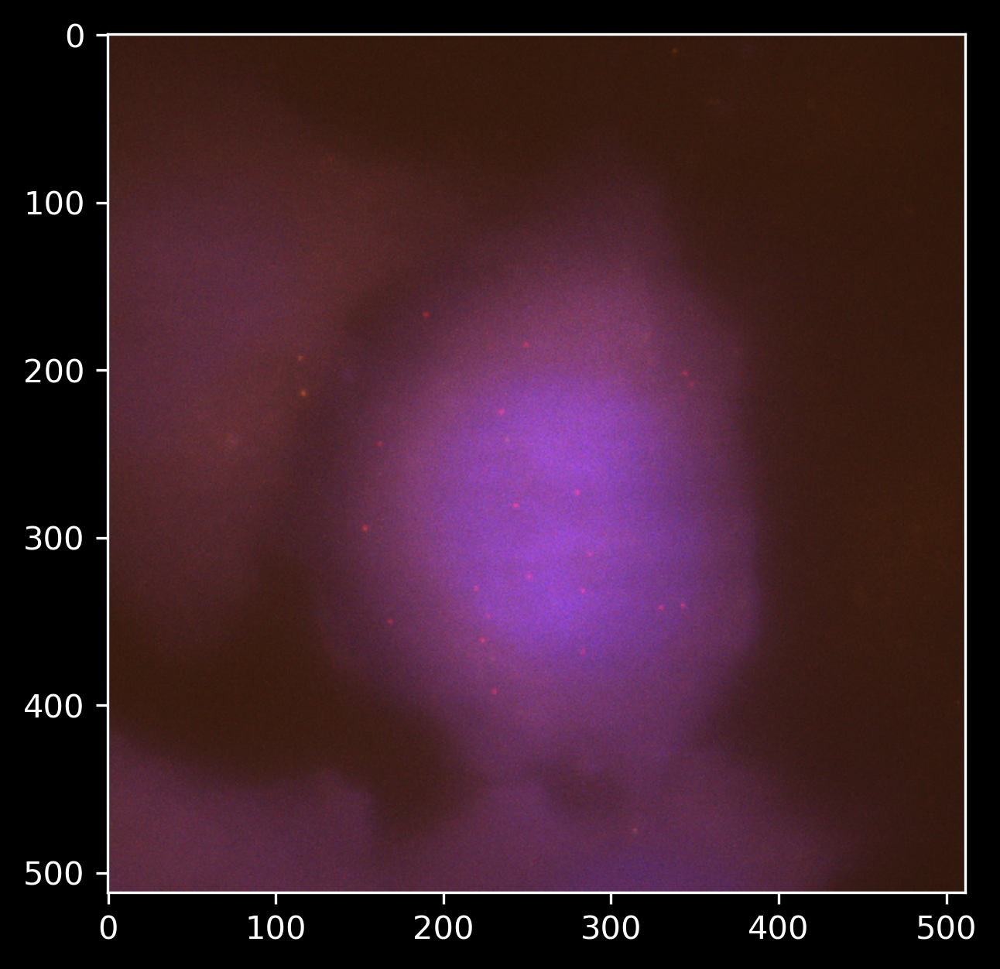

In [40]:
show_vid(video_array)

In [43]:
### Lets play around with the rsnaped settings and make more movies with your custom model
### Everything is now a function of time and spot, so we have a lot of flexibility

n_spots = 20

# Random spot sizes
sigmas = np.random.rand(n_spots) + .5
simulated_cell_KDM5B.config_dict['frame']['channel 0']['spots']['sigma'] = sigmas
simulated_cell_KDM5B.config_dict['frame']['channel 0']['spots']['sigma'] = sigmas
simulated_cell_KDM5B.config_dict['frame']['channel 0']['spots']['sigma'] = sigmas

# Intensity scales per channel, how bright compared to background?
simulated_cell_KDM5B.config_dict['frame']['channel 0']['spots']['intensity_scale'] = 10
simulated_cell_KDM5B.config_dict['frame']['channel 1']['spots']['intensity_scale'] = 300
simulated_cell_KDM5B.config_dict['frame']['channel 2']['spots']['intensity_scale'] = 500

# how noisy should the spots be?
simulated_cell_KDM5B.config_dict['frame']['channel 0']['spots']['photon_count'] = 300
simulated_cell_KDM5B.config_dict['frame']['channel 1']['spots']['photon_count'] = 300 
simulated_cell_KDM5B.config_dict['frame']['channel 2']['spots']['photon_count'] = 300

# How spread should the spots be?
jitter_sigma=.2
simulated_cell_KDM5B.config_dict['diffusion']['jitter']['method'] = 'gaussian'
simulated_cell_KDM5B.config_dict['diffusion']['jitter']['parameters'] = [jitter_sigma]


# Random diffusion rates per spot
simulated_cell_KDM5B.D = np.random.rand(n_spots)*5 + np.random.rand(n_spots)*1 


t = np.linspace(0,1500,int(1500/10)) # 0 to 1500s with 10s framerate
video_array, simulated_intensity, spot_positions = simulated_cell_KDM5B.gen(n_spots, t, verbose=1, disk_buffer=False, buffer_size=25) #generate a video w/ our custom model


Generating spot motion.....
Generating/loading intensity for mRNAs 0.....
Using C++.....


Generating video frames: 100%|██████████| 150/150 [00:00<00:00, 153.47it/s]


In [31]:
simulated_cell_KDM5B.config_dict['diffusion']['jitter']['method']

'gaussian'